In [3]:
!pip install gdown

# Data Preprocessing

In [4]:
import gdown

# Specify the Google Drive URL
url = "https://drive.google.com/uc?id=17YPw5suSHDxdD8qUW8DRQvS6Yo2xjx6F"
output = "mycheckpointfile"  # Specify the output filename0
gdown.download(url, output)

Downloading...
From (original): https://drive.google.com/uc?id=17YPw5suSHDxdD8qUW8DRQvS6Yo2xjx6F
From (redirected): https://drive.google.com/uc?id=17YPw5suSHDxdD8qUW8DRQvS6Yo2xjx6F&confirm=t&uuid=fcb5451b-7b1c-4ba2-b4e3-c3ffcfc80f68
To: /content/mycheckpointfile
100%|██████████| 7.61G/7.61G [00:54<00:00, 140MB/s]


'mycheckpointfile'

In [3]:
!ls

mycheckpointfile  sample_data


In [4]:
import tarfile
import os

# Specify the path to the downloaded tar file
tar_file_path = "mycheckpointfile"

# Specify the extraction directory
extract_dir = "extracted_data"
os.makedirs(extract_dir, exist_ok=True)

# Extract the contents of the tar file
with tarfile.open(tar_file_path, 'r') as tar_ref:
    tar_ref.extractall(extract_dir)

# Check the extracted files
extracted_files = os.listdir(extract_dir)
print("Extracted files:", extracted_files)

Extracted files: ['Task01_BrainTumour']


In [ ]:
!pip install nibabel


In [6]:
import nibabel as nib
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

import os
nii_img = nib.load('/content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_001.nii.gz')
img_shape = nii_img.get_fdata().shape

print("Shape of NIfTI image:", img_shape)

Shape of NIfTI image: (240, 240, 155)


In [7]:
image_dir = "/content/extracted_data/Task01_BrainTumour/imagesTr"

# List all files in the directory
files = os.listdir(image_dir)

# Count the number of files
total_images = len(files)

print("Total number of images:", total_images)


Total number of images: 495


In [8]:
import os

# Directory path
image_dir = "/content/extracted_data/Task01_BrainTumour/imagesTr"

# List all files in the directory
files = os.listdir(image_dir)

# Extract numbers from filenames and convert them to integers
existing_numbers = []
for filename in files:
    parts = filename.split('_')
    if len(parts) == 2 and parts[0] == 'BRATS' and parts[1].split('.')[0].isdigit():
        existing_numbers.append(int(parts[1].split('.')[0]))

# Expected range of numbers
expected_numbers = range(1, 496)

# Find missing numbers
missing_numbers = [num for num in expected_numbers if num not in existing_numbers]

# Print missing images
if missing_numbers:
    print("Missing images:")
    for num in missing_numbers:
        print(f"BRATS_{num:03d}.nii.gz")
else:
    print("No images are missing.")


Missing images:
BRATS_485.nii.gz
BRATS_486.nii.gz
BRATS_487.nii.gz
BRATS_488.nii.gz
BRATS_489.nii.gz
BRATS_490.nii.gz
BRATS_491.nii.gz
BRATS_492.nii.gz
BRATS_493.nii.gz
BRATS_494.nii.gz
BRATS_495.nii.gz


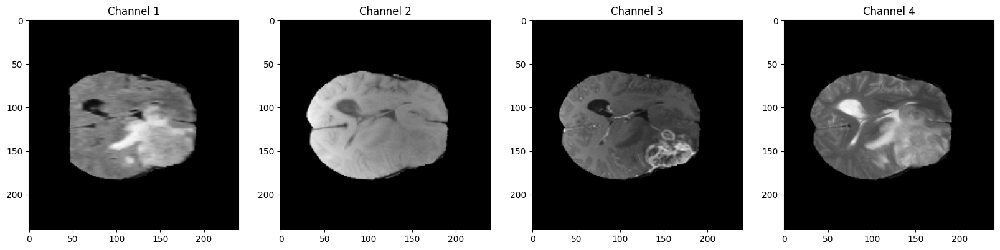

In [9]:
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NIfTI image
nii_img = nib.load('/content/extracted_data/Task01_BrainTumour/imagesTr/BRATS_009.nii.gz')
img_data = nii_img.get_fdata()

# Get the shape of the image data
img_shape = img_data.shape

# Define the number of channels
num_channels = img_shape[-1]

# Visualize each channel
fig, axes = plt.subplots(1, num_channels, figsize=(5*num_channels, 5))

for i in range(num_channels):
    # Show the i-th channel
    axes[i].imshow(img_data[:, :, 77, i], cmap='gray')
    axes[i].set_title(f'Channel {i+1}')

plt.show()

In [ ]:
image_path = "/content/extracted_data/Task01_BrainTumour/imagesTr/BRATS_120.nii.gz"
label_path = "/content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_120.nii.gz"

# Load the image and label data
img = nib.load(image_path)
label_img = nib.load(label_path)

# Get the image and label data arrays
image_data = img.get_fdata()
label_data = label_img.get_fdata()

# Use only the first channel (assuming 0-indexing)
image_data_single_channel = image_data[..., 0]

# Plot each slice with label overlay
for slice_index in range(image_data.shape[2]):
    plt.figure(figsize=(10, 5))

    # Plot the original MRI image for the single channel and current slice
    plt.subplot(1, 2, 1)
    plt.imshow(image_data_single_channel[:, :, slice_index], cmap='gray')
    plt.title(f"Slice {slice_index+1}")
    plt.axis('off')

    # Plot the overlay of the label data in red
    plt.subplot(1, 2, 2)
    plt.imshow(image_data_single_channel[:, :, slice_index], cmap='gray')
    plt.imshow(label_data[:, :, slice_index], alpha=0.5, cmap='Reds')
    plt.title(f"Slice {slice_index+1} with Label Overlay")
    plt.axis('off')

    plt.show()


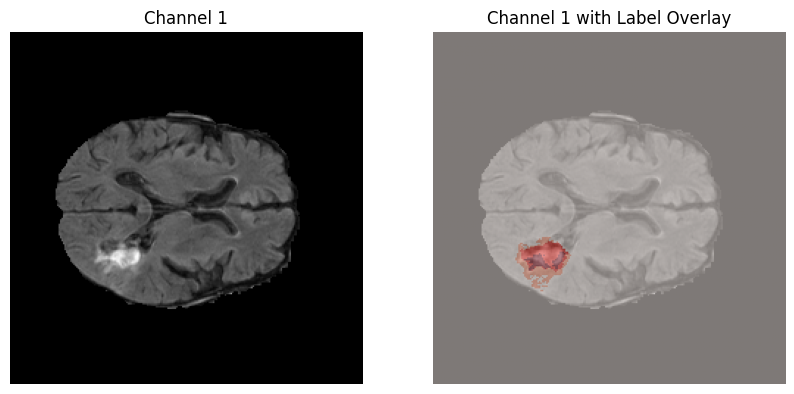

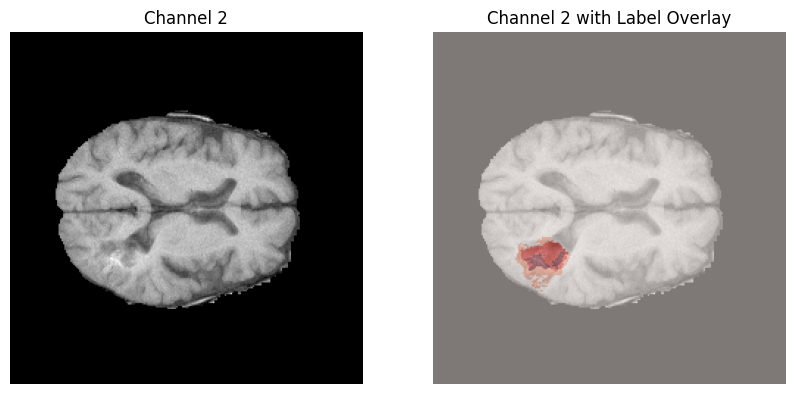

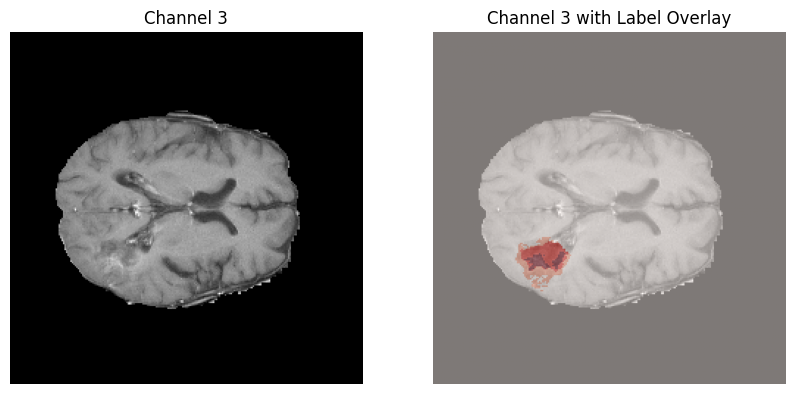

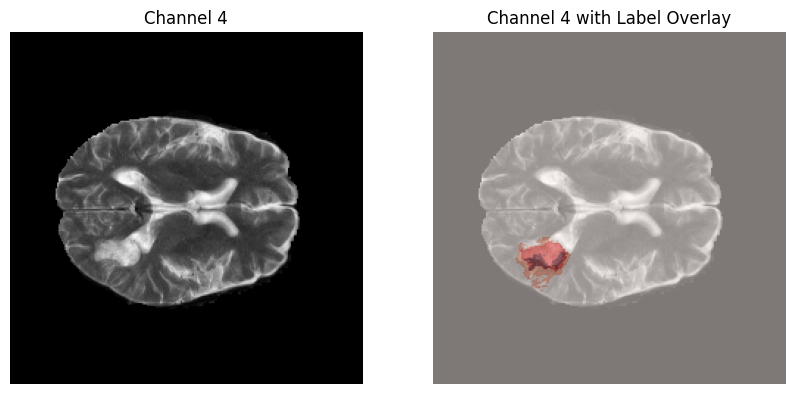

In [11]:
import nibabel as nib
import matplotlib.pyplot as plt

# Paths to image and label files
image_path = "/content/extracted_data/Task01_BrainTumour/imagesTr/BRATS_120.nii.gz"
label_path = "/content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_120.nii.gz"

# Load the image and label data
img = nib.load(image_path)
label_img = nib.load(label_path)

# Get the image and label data arrays
image_data = img.get_fdata()
label_data = label_img.get_fdata()

# Plot each channel with label overlay
for channel in range(image_data.shape[-1]):
    plt.figure(figsize=(10, 5))

    # Plot the original MRI image for the channel
    plt.subplot(1, 2, 1)
    plt.imshow(image_data[..., 77, channel], cmap='gray')  # Adjust the slice index as needed
    plt.title(f"Channel {channel+1}")
    plt.axis('off')

    # Plot the overlay of the label data in red
    plt.subplot(1, 2, 2)
    plt.imshow(image_data[..., 77, channel], cmap='gray')  # Adjust the slice index as needed
    plt.imshow(label_data[..., 77], alpha=0.5, cmap='Reds')  # Assuming label_data is 3D
    plt.title(f"Channel {channel+1} with Label Overlay")
    plt.axis('off')

    plt.show()


In [12]:
import os
import numpy as np
import nibabel as nib
from skimage.transform import resize
# Paths to image and label directories
image_dir = "/content/extracted_data/Task01_BrainTumour/imagesTr"
label_dir = "/content/extracted_data/Task01_BrainTumour/labelsTr"

# Get image and label files, ignoring hidden files
image_files = [f for f in sorted(os.listdir(image_dir)) if not f.startswith('.')][:200]
label_files = [f for f in sorted(os.listdir(label_dir)) if not f.startswith('.')][:200]
len(image_files)

200

In [13]:
import os
import numpy as np
import nibabel as nib
import scipy.ndimage

# Function to apply fixed bicubic resizing
def resize_mri(image, target_shape):
    """
    Resizes a 3D MRI image using bicubic interpolation.

    Parameters:
        image (numpy array): The 3D MRI image.
        target_shape (tuple): The target shape (height, width, depth).

    Returns:
        numpy array: The resized image.
    """
    scale_factors = [target_shape[i] / image.shape[i] for i in range(3)]

    # Apply fixed bicubic interpolation
    resized_image = scipy.ndimage.zoom(image, scale_factors, order=3)
    return resized_image

# Function to load and resize NIfTI data
def load_and_resize_nifti_data(file_path, new_shape, modality_index=3):
    """
    Loads and resizes a 4D NIfTI file, selecting only one modality.

    Parameters:
        file_path (str): Path to the .nii.gz file.
        new_shape (tuple): Target shape (height, width, depth).
        modality_index (int): Index of the modality to extract (0=T1, 1=T1c, 2=T2, 3=FLAIR).

    Returns:
        numpy array: The resized image.
    """
    try:
        print(f"📌 Attempting to load: {file_path}")

        if file_path.startswith("._"):  # Skip hidden system files
            print(f"⚠️ Skipping hidden file: {file_path}")
            return None

        nifti_img = nib.load(file_path)
        data = nifti_img.get_fdata()

        # Check if the file is 4D (has multiple modalities)
        if len(data.shape) == 4:
            if data.shape[-1] == 4:
                data = data[..., modality_index]  # Select the desired modality (default: FLAIR)
            else:
                print(f"⚠️ Unexpected 4D shape: {data.shape}, skipping file!")
                return None

        # Ensure data is now 3D
        if len(data.shape) != 3:
            print(f"❌ Invalid shape after extraction: {data.shape}")
            return None

        # Apply bicubic resizing
        resized_data = resize_mri(data, new_shape)
        return resized_data

    except Exception as e:
        print(f"❌ Error loading file: {file_path} - {e}")
        return None

# Directories (Update these paths if needed)
image_dir = "/content/extracted_data/Task01_BrainTumour/imagesTr"
label_dir = "/content/extracted_data/Task01_BrainTumour/labelsTr"

# Define new shape for resizing
new_shape = (128, 128, 128)

# Process Labels (y_data)
y_data = []
for label_file in os.listdir(label_dir):
    if not label_file.endswith(".nii.gz") or label_file.startswith("._"):  # Skip non-NIfTI files & hidden files
        continue

    label_path = os.path.join(label_dir, label_file)
    label_data = load_and_resize_nifti_data(label_path, new_shape)

    if label_data is not None:
        y_data.append(label_data)

y_data = np.array(y_data)

# Process Images (X_data)
X_data = []
for img_file in os.listdir(image_dir):
    if not img_file.endswith(".nii.gz") or img_file.startswith("._"):  # Skip non-NIfTI files & hidden files
        continue

    img_path = os.path.join(image_dir, img_file)

    # Select a modality (0=T1, 1=T1c, 2=T2, 3=FLAIR)
    img_data = load_and_resize_nifti_data(img_path, new_shape, modality_index=3)  # Use FLAIR

    if img_data is not None:
        X_data.append(img_data)

X_data = np.array(X_data)

# Print final dimensions
print(f"\n✅ Final Resized X_data shape: {X_data.shape} (Expected: (495, 128, 128, 128))")
print(f"✅ Final Resized y_data shape: {y_data.shape} (Expected: (485, 128, 128, 128))")

# Check for mismatches
if len(X_data) != len(y_data):
    print(f"⚠️ Warning: {len(X_data)} images and {len(y_data)} labels found. Check for mismatches!")


📌 Attempting to load: /content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_413.nii.gz
📌 Attempting to load: /content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_010.nii.gz
📌 Attempting to load: /content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_327.nii.gz
📌 Attempting to load: /content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_240.nii.gz
📌 Attempting to load: /content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_070.nii.gz
📌 Attempting to load: /content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_022.nii.gz
📌 Attempting to load: /content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_420.nii.gz
📌 Attempting to load: /content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_209.nii.gz
📌 Attempting to load: /content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_253.nii.gz
📌 Attempting to load: /content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_118.nii.gz
📌 Attempting to load: /content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_196.nii.gz

In [14]:
import nibabel as nib
img = nib.load("/content/extracted_data/Task01_BrainTumour/imagesTr/BRATS_484.nii.gz")
print(img.shape)


(240, 240, 155, 4)


In [15]:
import nibabel as nib

file_path = "/content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_166.nii.gz"

try:
    img = nib.load(file_path)
    print(f"✅ {file_path} is a valid NIfTI file with shape: {img.shape}")
except Exception as e:
    print(f"❌ Error loading {file_path}: {e}")


✅ /content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_166.nii.gz is a valid NIfTI file with shape: (240, 240, 155)


In [16]:
# Print shapes for verification
print("X_data shape:", X_data.shape)  # Shape of preprocessed image data
print("y_data shape:", y_data.shape)  # Shape of preprocessed label data

X_data shape: (484, 128, 128, 128)
y_data shape: (484, 128, 128, 128)


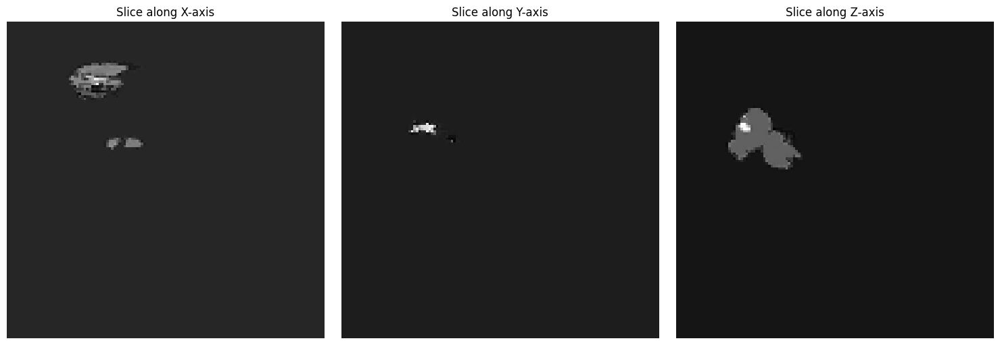

In [17]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming y_data is your dataset with the shape (80, 128, 128, 128)
first_image = y_data[10]  # This selects the first 3D volume

# To visualize slices along the X, Y, and Z axes, choose the middle index for each.
slice_x = first_image[first_image.shape[0] // 2, :, :]
slice_y = first_image[:, first_image.shape[1] // 2, :]
slice_z = first_image[:, :, first_image.shape[2] // 2]

# Now, visualize these slices.
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(slice_x, cmap='gray')
axes[0].set_title('Slice along X-axis')
axes[0].axis('off')  # Hide the axis for a cleaner look

axes[1].imshow(slice_y, cmap='gray')
axes[1].set_title('Slice along Y-axis')
axes[1].axis('off')

axes[2].imshow(slice_z, cmap='gray')
axes[2].set_title('Slice along Z-axis')
axes[2].axis('off')

plt.tight_layout()
plt.show()


In [18]:
train_size = 350
test_size = 134

# Split into train and test sets
x_train = X_data[:train_size]
y_train = y_data[:train_size]

x_test = X_data[train_size:train_size + test_size]
y_test = y_data[train_size:train_size + test_size]

# Shapes of the train and test sets
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

x_train shape: (350, 128, 128, 128)
y_train shape: (350, 128, 128, 128)
x_test shape: (134, 128, 128, 128)
y_test shape: (134, 128, 128, 128)


In [19]:
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

In [20]:
import tensorflow as tf

def list_available_gpus():
    gpus = tf.config.list_physical_devices('GPU')
    if gpus:
        print("Available GPUs:")
        for gpu in gpus:
            print(gpu)
    else:
        print("No GPUs available.")

list_available_gpus()


Available GPUs:
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


# `Model Traning`

# Unet Model

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, MaxPooling3D, UpSampling3D, concatenate, BatchNormalization, Dropout

# Custom Strassen-based Convolution Layer
class StrassenConv3D(tf.keras.layers.Layer):
    def __init__(self, filters, kernel_size=3, strides=(1, 1, 1), padding="same", **kwargs):
        super(StrassenConv3D, self).__init__(**kwargs)
        self.filters = filters
        self.kernel_size = kernel_size
        self.strides = strides
        self.padding = padding

    def build(self, input_shape):
        num_channels = input_shape[-1]

        # Ensure num_channels is divisible by 2 (Pad if necessary)
        if num_channels % 2 != 0:
            num_channels += 1

        self.kernel = self.add_weight(
            name="kernel",
            shape=(self.kernel_size, self.kernel_size, self.kernel_size, num_channels, self.filters),
            initializer="glorot_uniform",
            trainable=True,
        )

    def strassen_multiply(self, A, B):
        """ Implements Strassen's multiplication for 2D matrices recursively """
        assert A.shape == B.shape, "Matrices must be square and of the same size"
        n = A.shape[0]

        if n == 1:  # Base case: direct multiplication
            return A * B

        mid = n // 2

        # Splitting the matrices into quadrants
        A11, A12, A21, A22 = A[:mid, :mid], A[:mid, mid:], A[mid:, :mid], A[mid:, mid:]
        B11, B12, B21, B22 = B[:mid, :mid], B[:mid, mid:], B[mid:, :mid], B[mid:, mid:]

        # Strassen’s formulas
        M1 = self.strassen_multiply(A11 + A22, B11 + B22)
        M2 = self.strassen_multiply(A21 + A22, B11)
        M3 = self.strassen_multiply(A11, B12 - B22)
        M4 = self.strassen_multiply(A22, B21 - B11)
        M5 = self.strassen_multiply(A11 + A12, B22)
        M6 = self.strassen_multiply(A21 - A11, B11 + B12)
        M7 = self.strassen_multiply(A12 - A22, B21 + B22)

        # Compute the resulting quadrants
        C11 = M1 + M4 - M5 + M7
        C12 = M3 + M5
        C21 = M2 + M4
        C22 = M1 - M2 + M3 + M6

        # Reconstruct full matrix
        C = tf.concat([
            tf.concat([C11, C12], axis=1),
            tf.concat([C21, C22], axis=1)
        ], axis=0)

        return C

    def call(self, inputs):
        """ Applies 3D convolution using Strassen's multiplication """
        
        # Extract patches from input tensor
        patches = tf.image.extract_patches(
            images=inputs,
            sizes=[1, self.kernel_size, self.kernel_size, self.kernel_size, 1],
            strides=[1, self.strides[0], self.strides[1], self.strides[2], 1],
            rates=[1, 1, 1, 1, 1],
            padding=self.padding.upper()
        )

        # Reshape patches to match the kernel
        patches_shape = tf.shape(patches)
        patches = tf.reshape(patches, [-1, self.kernel_size, self.kernel_size, self.kernel_size])

        # Apply Strassen multiplication
        conv_output = self.strassen_multiply(patches, self.kernel)

        # Reshape back to expected output shape
        output_shape = patches_shape[:3] + [self.filters]
        conv_output = tf.reshape(conv_output, output_shape)

        return conv_output

    def compute_output_shape(self, input_shape):
        return input_shape[:-1] + (self.filters,)

# U-Net 3D with Strassen’s Convolution
def unet_3d_model(input_shape=(128, 128, 128, 2)):
    inputs = Input(input_shape)

    # Encoder
    conv1 = StrassenConv3D(32, 3)(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = StrassenConv3D(32, 3)(conv1)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPooling3D(pool_size=(2, 2, 2))(conv1)

    conv2 = StrassenConv3D(64, 3)(pool1)
    conv2 = BatchNormalization()(conv2)
    conv2 = StrassenConv3D(64, 3)(conv2)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPooling3D(pool_size=(2, 2, 2))(conv2)

    conv3 = StrassenConv3D(128, 3)(pool2)
    conv3 = BatchNormalization()(conv3)
    conv3 = StrassenConv3D(128, 3)(conv3)
    conv3 = BatchNormalization()(conv3)
    pool3 = MaxPooling3D(pool_size=(2, 2, 2))(conv3)

    # Bottom layer
    conv4 = StrassenConv3D(256, 3)(pool3)
    conv4 = BatchNormalization()(conv4)
    conv4 = Dropout(0.5)(conv4)

    # Decoder
    up5 = concatenate([UpSampling3D(size=(2, 2, 2))(conv4), conv3], axis=-1)
    conv5 = StrassenConv3D(128, 3)(up5)
    conv5 = BatchNormalization()(conv5)

    up6 = concatenate([UpSampling3D(size=(2, 2, 2))(conv5), conv2], axis=-1)
    conv6 = StrassenConv3D(64, 3)(up6)
    conv6 = BatchNormalization()(conv6)

    up7 = concatenate([UpSampling3D(size=(2, 2, 2))(conv6), conv1], axis=-1)
    conv7 = StrassenConv3D(32, 3)(up7)
    conv7 = BatchNormalization()(conv7)

    # Output layer
    output = tf.keras.layers.Conv3D(2, (1, 1, 1), activation='softmax')(conv7)

    model = Model(inputs=inputs, outputs=output)
    return model

# Create and summarize the model
model = unet_3d_model(input_shape=(128, 128, 128, 2))
model.summary()


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14            │ (None, 128, 128, 128,  │              0 │ -                      │
│ (InputLayer)              │ 2)                     │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ cast_14 (Cast)            │ (None, 128, 128, 128,  │              0 │ input_layer_14[0][0]   │
│                           │ 2)                     │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ strassen_conv3d_67        │ (None, 128, 128, 128,  │          1,728 │ cast_14[0][0]          │
│ (StrassenConv3D)          │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_57    │ (None, 128, 128, 128,  │            128 │ strassen_conv3d_67[0]… │
│ (BatchNormalization)      │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ strassen_conv3d_68        │ (None, 128, 128, 128,  │         27,648 │ batch_normalization_5… │
│ (StrassenConv3D)          │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_58    │ (None, 128, 128, 128,  │            128 │ strassen_conv3d_68[0]… │
│ (BatchNormalization)      │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling3d_12          │ (None, 64, 64, 64, 32) │              0 │ batch_normalization_5… │
│ (MaxPooling3D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ strassen_conv3d_69        │ (None, 64, 64, 64, 64) │         55,296 │ max_pooling3d_12[0][0] │
│ (StrassenConv3D)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_59    │ (None, 64, 64, 64, 64) │            256 │ strassen_conv3d_69[0]… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ strassen_conv3d_70        │ (None, 64, 64, 64, 64) │        110,592 │ batch_normalization_5… │
│ (StrassenConv3D)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_60    │ (None, 64, 64, 64, 64) │            256 │ strassen_conv3d_70[0]… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling3d_13          │ (None, 32, 32, 32, 64) │              0 │ batch_normalization_6… │
│ (MaxPooling3D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ strassen_conv3d_71        │ (None, 32, 32, 32,     │        221,184 │ max_pooling3d_13[0][0] │
│ (StrassenConv3D)          │ 128)                   │                │                        │
├──────────────────────

 Total params: 3,489,154 (13.31 MB)

 Trainable params: 3,487,298 (13.30 MB)

 Non-trainable params: 1,856 (7.25 KB)

In [ ]:
# Plot the validation and training data separately
def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['dice_coefficient']
  val_accuracy = history.history['val_dice_coefficient']

  epochs = range(len(history.history['loss']))
  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_dice_coefficient')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

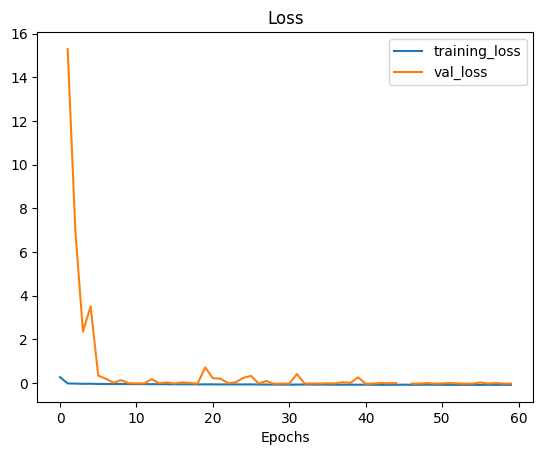

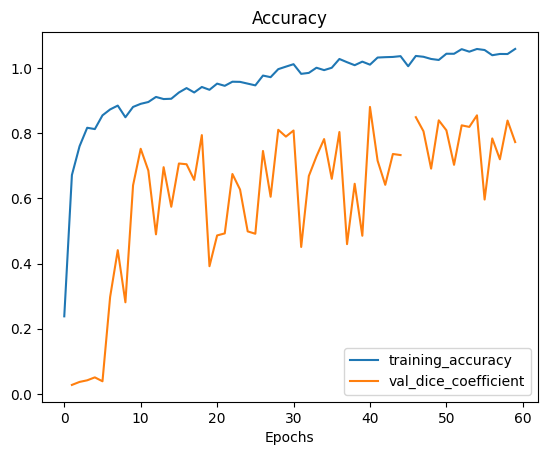

In [ ]:
plot_loss_curves(history)

# Vnet Model

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv3D, MaxPooling3D, UpSampling3D, concatenate, BatchNormalization, Dropout

def vnet_3d_model(input_shape=(128, 128, 128, 1)):
    # Input layer
    inputs = Input(input_shape)

    # Encoder
    conv1 = Conv3D(16, (5, 5, 5), activation='relu', padding='same')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv2 = Conv3D(32, (5, 5, 5), activation='relu', padding='same')(conv1)
    conv2 = BatchNormalization()(conv2)
    pool1 = MaxPooling3D(pool_size=(2, 2, 2))(conv2)

    conv3 = Conv3D(64, (5, 5, 5), activation='relu', padding='same')(pool1)
    conv3 = BatchNormalization()(conv3)
    conv4 = Conv3D(128, (5, 5, 5), activation='relu', padding='same')(conv3)
    conv4 = BatchNormalization()(conv4)
    pool2 = MaxPooling3D(pool_size=(2, 2, 2))(conv4)

    conv5 = Conv3D(256, (5, 5, 5), activation='relu', padding='same')(pool2)
    conv5 = BatchNormalization()(conv5)
    conv6 = Conv3D(512, (5, 5, 5), activation='relu', padding='same')(conv5)
    conv6 = BatchNormalization()(conv6)

    # Decoder
    up7 = concatenate([UpSampling3D(size=(2, 2, 2))(conv6), conv4], axis=-1)
    conv7 = Conv3D(128, (5, 5, 5), activation='relu', padding='same')(up7)
    conv7 = BatchNormalization()(conv7)
    conv8 = Conv3D(64, (5, 5, 5), activation='relu', padding='same')(conv7)
    conv8 = BatchNormalization()(conv8)

    up9 = concatenate([UpSampling3D(size=(2, 2, 2))(conv8), conv2], axis=-1)
    conv9 = Conv3D(32, (5, 5, 5), activation='relu', padding='same')(up9)
    conv9 = BatchNormalization()(conv9)
    conv10 = Conv3D(16, (5, 5, 5), activation='relu', padding='same')(conv9)
    conv10 = BatchNormalization()(conv10)

    # Output layer
    output = Conv3D(1, (1, 1, 1), dtype="float32", activation='sigmoid')(conv10)

    # Model
    model = Model(inputs=inputs, outputs=output)
    return model

# Create the VNet model
model_Vnet = vnet_3d_model(input_shape=(128, 128, 128, 1))  # Adjust input_shape to match your data
model_Vnet.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 128, 128, 128,  │              0 │ -                      │
│ (InputLayer)              │ 1)                     │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ cast_2 (Cast)             │ (None, 128, 128, 128,  │              0 │ input_layer_1[0][0]    │
│                           │ 1)                     │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_15 (Conv3D)        │ (None, 128, 128, 128,  │          2,016 │ cast_2[0][0]           │
│                           │ 16)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_14    │ (None, 128, 128, 128,  │             64 │ conv3d_15[0][0]        │
│ (BatchNormalization)      │ 16)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_16 (Conv3D)        │ (None, 128, 128, 128,  │         64,032 │ batch_normalization_1… │
│                           │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_15    │ (None, 128, 128, 128,  │            128 │ conv3d_16[0][0]        │
│ (BatchNormalization)      │ 32)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling3d_3           │ (None, 64, 64, 64, 32) │              0 │ batch_normalization_1… │
│ (MaxPooling3D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_17 (Conv3D)        │ (None, 64, 64, 64, 64) │        256,064 │ max_pooling3d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_16    │ (None, 64, 64, 64, 64) │            256 │ conv3d_17[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_18 (Conv3D)        │ (None, 64, 64, 64,     │      1,024,128 │ batch_normalization_1… │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_17    │ (None, 64, 64, 64,     │            512 │ conv3d_18[0][0]        │
│ (BatchNormalization)      │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling3d_4           │ (None, 32, 32, 32,     │              0 │ batch_normalization_1… │
│ (MaxPooling3D)            │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_19 (Conv3D)        │ (None, 32, 32, 32,     │      4,096,256 │ max_pooling3d_4[0][0]  │
│                           │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1

 Total params: 33,544,257 (127.96 MB)

 Trainable params: 33,541,761 (127.95 MB)

 Non-trainable params: 2,496 (9.75 KB)

In [ ]:

model_Vnet.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=[dice_coefficient])

# Fit the model to the training data
history = model_Vnet.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=60, batch_size=2)

Epoch 1/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 341s 680ms/step - dice_coefficient: 0.0682 - loss: 0.6230 - val_dice_coefficient: 0.0274 - val_loss: 15.1659
Epoch 2/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 33s 412ms/step - dice_coefficient: 0.1112 - loss: 0.2821 - val_dice_coefficient: 0.0809 - val_loss: 2.8550
Epoch 3/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 33s 412ms/step - dice_coefficient: 0.1821 - loss: 0.1278 - val_dice_coefficient: 0.0365 - val_loss: 4.8394
Epoch 4/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 33s 412ms/step - dice_coefficient: 0.2396 - loss: 0.0628 - val_dice_coefficient: 0.0605 - val_loss: 2.9919
Epoch 5/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 33s 412ms/step - dice_coefficient: 0.3354 - loss: 0.0171 - val_dice_coefficient: 0.1761 - val_loss: 0.5894
Epoch 6/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 33s 411ms/step - dice_coefficient: 0.4231 - loss: -0.0114 - val_dice_coefficient: 0.2094 - val_loss: 1.4932
Epoch 7/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 33s 412ms/step - dice_coefficient: 0.5184 - loss: -0.0234 - val_dice_coefficient: 0.3304 

In [ ]:
# Save the V-Net model in .keras format after training
model_Vnet.save('Vnet.keras')

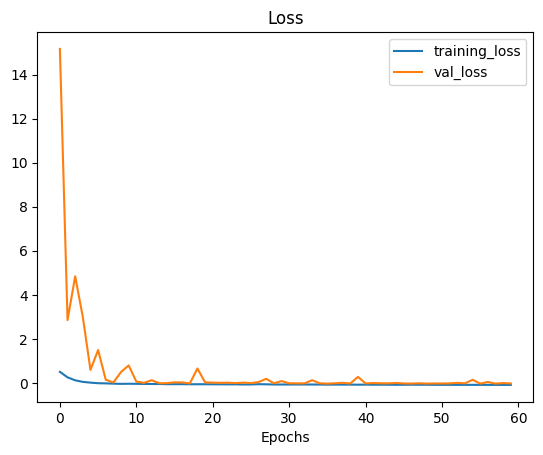

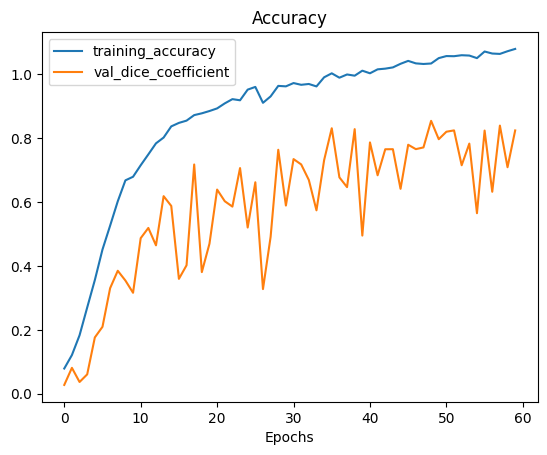

In [ ]:
plot_loss_curves(history)

# SegNet Model

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv3D, MaxPooling3D, UpSampling3D, concatenate, BatchNormalization, Dropout

def segnet_3d_model(input_shape=(128, 128, 128, 1)):
    # Input layer
    inputs = Input(input_shape)

    # Encoder
    conv1 = Conv3D(32, (3, 3, 3), activation='relu', padding='same')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Conv3D(32, (3, 3, 3), activation='relu', padding='same')(conv1)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPooling3D(pool_size=(2, 2, 2))(conv1)

    conv2 = Conv3D(64, (3, 3, 3), activation='relu', padding='same')(pool1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Conv3D(64, (3, 3, 3), activation='relu', padding='same')(conv2)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPooling3D(pool_size=(2, 2, 2))(conv2)

    conv3 = Conv3D(128, (3, 3, 3), activation='relu', padding='same')(pool2)
    conv3 = BatchNormalization()(conv3)
    conv3 = Conv3D(128, (3, 3, 3), activation='relu', padding='same')(conv3)
    conv3 = BatchNormalization()(conv3)
    pool3 = MaxPooling3D(pool_size=(2, 2, 2))(conv3)

    # Bottom layer
    conv4 = Conv3D(256, (3, 3, 3), activation='relu', padding='same')(pool3)
    conv4 = BatchNormalization()(conv4)
    conv4 = Conv3D(256, (3, 3, 3), activation='relu', padding='same')(conv4)
    conv4 = BatchNormalization()(conv4)
    conv4 = Dropout(0.5)(conv4)

    # Decoder
    up5 = UpSampling3D(size=(2, 2, 2))(conv4)
    conv5 = Conv3D(128, (3, 3, 3), activation='relu', padding='same')(up5)
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv3D(128, (3, 3, 3), activation='relu', padding='same')(conv5)
    conv5 = BatchNormalization()(conv5)
    conv5 = Dropout(0.5)(conv5)

    up6 = UpSampling3D(size=(2, 2, 2))(conv5)
    conv6 = Conv3D(64, (3, 3, 3), activation='relu', padding='same')(up6)
    conv6 = BatchNormalization()(conv6)
    conv6 = Conv3D(64, (3, 3, 3), activation='relu', padding='same')(conv6)
    conv6 = BatchNormalization()(conv6)
    conv6 = Dropout(0.5)(conv6)

    up7 = UpSampling3D(size=(2, 2, 2))(conv6)
    conv7 = Conv3D(32, (3, 3, 3), activation='relu', padding='same')(up7)
    conv7 = BatchNormalization()(conv7)
    conv7 = Conv3D(32, (3, 3, 3), activation='relu', padding='same')(conv7)
    conv7 = BatchNormalization()(conv7)

    # Output layer
    output = Conv3D(1, (1, 1, 1), dtype="float32", activation='sigmoid')(conv7)

    # Model
    model = Model(inputs=inputs, outputs=output)
    return model

# Create the 3D SegNet model
model = segnet_3d_model(input_shape=(128, 128, 128, 1))  # Adjust input_shape to match your data
model.summary()


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 128, 128, 128, 1)    │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_4 (Cast)                        │ (None, 128, 128, 128, 1)    │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_26 (Conv3D)                   │ (None, 128, 128, 128, 32)   │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_24               │ (None, 128, 128, 128, 32)   │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_27 (Conv3D)                   │ (None, 128, 128, 128, 32)   │          27,680 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_25               │ (None, 128, 128, 128, 32)   │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_5 (MaxPooling3D)       │ (None, 64, 64, 64, 32)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_28 (Conv3D)                   │ (None, 64, 64, 64, 64)      │          55,360 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_26               │ (None, 64, 64, 64, 64)      │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_29 (Conv3D)                   │ (None, 64, 64, 64, 64)      │         110,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_27               │ (None, 64, 64, 64, 64)      │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_6 (MaxPooling3D)       │ (None, 32, 32, 32, 64)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_30 (Conv3D)                   │ (None, 32, 32, 32, 128)     │         221,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_28               │ (None, 32, 32, 32, 128)     │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_31 (Conv3D)                   │ (None, 32, 32, 32, 128)     │         442,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_29               │ (None, 32, 32, 32, 128)     │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_7 (MaxPooling3D)       │ (None, 16, 16, 16, 128)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_32 (Conv3D)                   │ (None, 16, 16, 16, 256)     │         884,992 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 5,261,057 (20.07 MB)

 Trainable params: 5,258,241 (20.06 MB)

 Non-trainable params: 2,816 (11.00 KB)

In [ ]:
from tensorflow.keras.optimizers import Adam


def dice_coefficient(y_true, y_pred):
    smooth = 1e-5
    # Squeeze the prediction to remove the extra dimension if present
    y_pred = tf.squeeze(y_pred, axis=-1)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice = (2. * intersection + smooth) / (union + smooth)
    return dice
model.compile(optimizer=Adam(learning_rate=1e-2), loss='binary_crossentropy', metrics=[dice_coefficient])

# Fit the model to the training data
history = model.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=60, batch_size=2)


Epoch 1/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - dice_coefficient: 0.1116 - loss: 0.4057 - val_dice_coefficient: 0.0273 - val_loss: 15.7190
Epoch 2/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - dice_coefficient: 0.6580 - loss: -0.0016 - val_dice_coefficient: 0.2079 - val_loss: 0.7340
Epoch 3/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - dice_coefficient: 0.7417 - loss: -0.0174 - val_dice_coefficient: 0.3392 - val_loss: 0.2454
Epoch 4/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - dice_coefficient: 0.7696 - loss: -0.0197 - val_dice_coefficient: 0.3106 - val_loss: 0.1976
Epoch 5/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - dice_coefficient: 0.7941 - loss: -0.0290 - val_dice_coefficient: 0.3464 - val_loss: 0.0896
Epoch 6/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - dice_coefficient: 0.7956 - loss: -0.0277 - val_dice_coefficient: 0.3012 - val_loss: 0.3452
Epoch 7/60
80/80 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - dice_coefficient: 0.7931 - loss: -0.0270 - val_dice_coefficient: 0.3379 - val_los

In [ ]:
model.save('SegNET.keras')

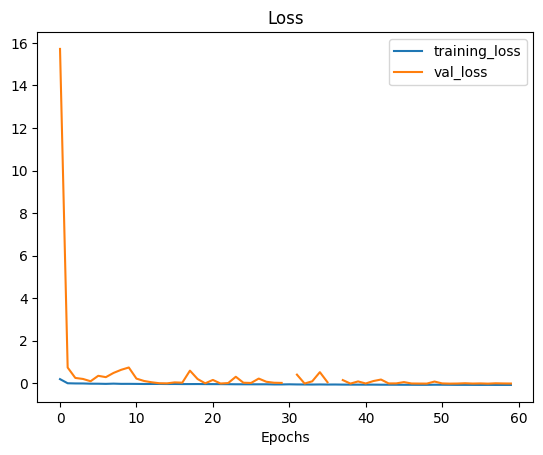

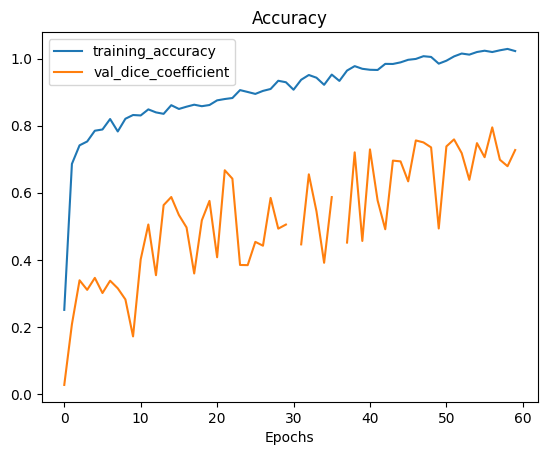

In [ ]:
plot_loss_curves(history)

In [ ]:
nii_image_path="/content/extracted_data/Task01_BrainTumour/imagesTr/BRATS_053.nii.gz"
nii_img = nib.load(nii_image_path)

# Get the image data
nii_data = nii_img.get_fdata()

print(nii_data.shape)

(240, 240, 155, 4)


In [ ]:
data=nii_data[...,0]
data.shape

(240, 240, 155)

In [ ]:
new_shape = (128, 128, 128)
resized_data = resize(data, new_shape, anti_aliasing=True)
# Ensure the resized image data has a single channel
resized_data = np.expand_dims(resized_data, axis=-1)
# Perform prediction
prediction = model.predict(np.expand_dims(resized_data, axis=0))

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


In [ ]:
prediction.shape

(1, 128, 128, 128, 1)

In [ ]:
predicted_data = prediction[0]
predicted_data.shape

(128, 128, 128, 1)

In [ ]:
from tensorflow.keras.models import load_model
from skimage.transform import resize
import matplotlib.pyplot as plt

def predicted_segmentation(nii_image_path):
    # Load the NIfTI image
    nii_img = nib.load(nii_image_path)

    # Get the image data
    nii_data = nii_img.get_fdata()

    # Resize the image data to match the required input shape (128, 128, 128)
    new_shape = (128, 128, 128)
    resized_data = resize(nii_data, new_shape, anti_aliasing=True)

    # Ensure the resized image data has a single channel
    resized_data = np.expand_dims(resized_data, axis=-1)
    # Perform prediction
    prediction = model.predict(np.expand_dims(resized_data, axis=0))

    # Extract the volume from the batch dimension
    predicted_data = prediction[0]

    # Plot a slice of the predicted volume (e.g., middle slice along each axis)
    slice_x = predicted_data.shape[0] // 2
    slice_y = predicted_data.shape[1] // 2
    slice_z = predicted_data.shape[2] // 2

    plt.figure(figsize=(15, 5))

    # Plot slices along the X-axis
    plt.subplot(1, 3, 1)
    plt.imshow(predicted_data[slice_x, :, :, 0], cmap='gray')
    plt.title('Slice along X-axis')

    # Plot slices along the Y-axis
    plt.subplot(1, 3, 2)
    plt.imshow(predicted_data[:, slice_y, :, 0], cmap='gray')
    plt.title('Slice along Y-axis')
    # Plot slices along the Z-axis
    plt.subplot(1, 3, 3)
    plt.imshow(predicted_data[:, :, slice_z, 0], cmap='gray')
    plt.title('Slice along Z-axis')

    plt.show()

In [ ]:
def actual_segmentation(label_path):
    # Load the label image
    label_img = nib.load(label_path)

    # Get the image data
    actual_label = label_img.get_fdata()

    # Plot a slice of the image (e.g., middle slice along each axis)
    slice_x = actual_label.shape[0] // 2
    slice_y = actual_label.shape[1] // 2
    slice_z = actual_label.shape[2] // 2

    plt.figure(figsize=(10, 10))

    plt.subplot(1, 3, 1)
    plt.imshow(actual_label[slice_x, :, :], cmap='gray')
    plt.title('Slice along X-axis')

    plt.subplot(1, 3, 2)
    plt.imshow(actual_label[:, slice_y, :], cmap='gray')
    plt.title('Slice along Y-axis')
    plt.subplot(1, 3, 3)
    plt.imshow(actual_label[:, :, slice_z], cmap='gray')
    plt.title('Slice along Z-axis')

    plt.show()

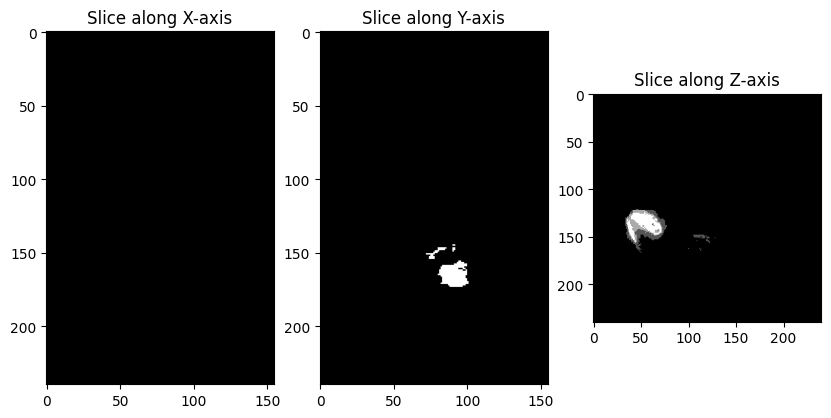

In [ ]:
label_path = "/content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_053.nii.gz"
actual_segmentation(label_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


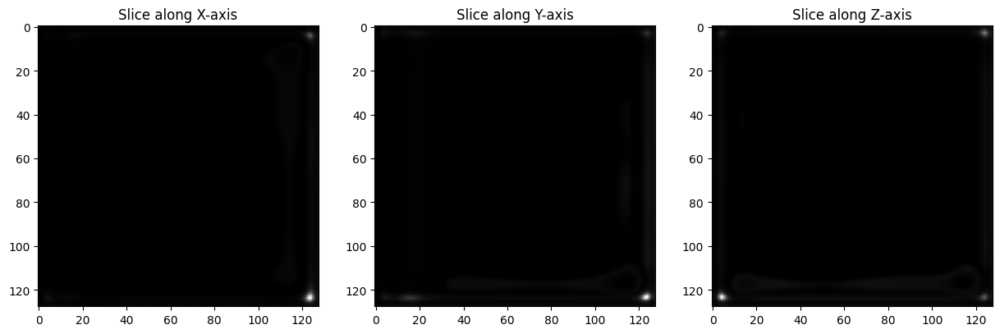

In [ ]:
predicted_segmentation("/content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_055.nii.gz")

In [ ]:
!pip install celluloid

In [ ]:
!pip install IPython

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 20.8 MB/s eta 0:00:00


In [ ]:
%matplotlib notebook
from pathlib import Path
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
from celluloid import Camera
from IPython.display import HTML

In [ ]:
# Define the paths to the image and label files
image_path = Path("/content/extracted_data/Task01_BrainTumour/imagesTr/BRATS_055.nii.gz")
label_path = Path("/content/extracted_data/Task01_BrainTumour/labelsTr/BRATS_053.nii.gz")

# Load the image and label data
image_data = nib.load(image_path).get_fdata()
label_data = nib.load(label_path).get_fdata().astype(int)  # Class labels should not be handled as float64

# Create the figure and camera object
fig = plt.figure()
camera = Camera(fig)
# Iterate over slices in the z-axis
for i in range(image_data.shape[2]):
    # Display the CT scan slice
    plt.imshow(image_data[:,:,i,1], cmap="bone")
    # Overlay the label mask with transparency
    mask = np.ma.masked_where(label_data[:,:,i] == 0, label_data[:,:,i])
    plt.imshow(mask, alpha=0.5)
    camera.snap()  # Store the current slice

# Animate the slices
plt.tight_layout()
animation = camera.animate()

<IPython.core.display.Javascript object>

In [ ]:
HTML(animation.to_html5_video())

# Experiments

In [ ]:
# Define the paths to the image and label files
image_path = Path("/kaggle/working/extracted_data/Task01_BrainTumour/imagesTr/BRATS_055.nii.gz")
label_path = Path("/kaggle/working/extracted_data/Task01_BrainTumour/labelsTr/BRATS_055.nii.gz")

# Load the image and label data
image_data = nib.load(image_path).get_fdata()
label_data = nib.load(label_path).get_fdata().astype(int)  # Class labels should not be handled as float64

# Create the figure and camera object
fig = plt.figure()
camera = Camera(fig)

# Iterate over slices in the z-axis
for i in range(image_data.shape[2]):
    # Display the CT scan slice
    plt.imshow(image_data[:,:,i,1], cmap="bone")
    # Overlay the label mask with transparency
    mask = np.ma.masked_where(label_data[:,:,i] == 0, label_data[:,:,i])
    plt.imshow(mask, alpha=0.5)
    camera.snap()  # Store the current slice

plt.tight_layout()
animation = camera.animate()

# Display the animation as HTML5 video
HTML(animation.to_jshtml())


<IPython.core.display.Javascript object>